<a href="https://colab.research.google.com/github/WilliamShengYangHuang/AALU_Workshop_3/blob/main/Image_grid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


This script reads all images from a specified folder and displays them in a grid layout using Python. You can define the number of columns (columns) to control how many images appear per row. Images are displayed tightly without titles or gaps for a clean presentation. To use, set the folder_path to your image folder, adjust columns as needed, and run the script. Missing images or extra slots are handled automatically.

In [1]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


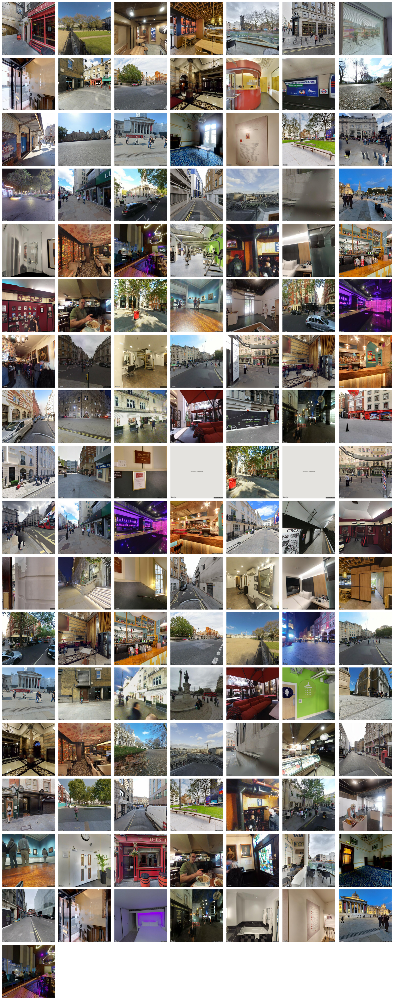

In [14]:
folder_path = "/content/drive/MyDrive/poi_images_around_Trafalgar_Square"  #@param{type:'string'}
columns = 7  #@param{type:'slider', min:0, max:20, step:1}
wspace = 0.05  #@param{type:'slider', min:0, max:0.5, step:0.05}
hspace = 0.05  #@param{type:'slider', min:0, max:0.5, step:0.05}

def load_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('png', 'jpg', 'jpeg', 'bmp', 'gif')):
            img_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(img_path).convert('RGB')
                images.append(np.array(img))
            except Exception as e:
                print(f"Error loading image {filename}: {e}")
    return images

def display_images_tightly(images, columns):
    total_images = len(images)
    rows = (total_images + columns - 1) // columns

    fig, axs = plt.subplots(rows, columns, figsize=(columns * 3, rows * 3))
    axs = axs.flatten()

    for idx, img in enumerate(images):
        axs[idx].imshow(img)
        axs[idx].axis('off')

    for j in range(len(images), len(axs)):
        axs[j].axis('off')

    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    plt.show()


images = load_images_from_folder(folder_path)


if images:
    display_images_tightly(images, columns)
else:
    print("No images found in the specified folder.")